In [1]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn.metrics import silhouette_score

read the csv after finding horizontal threshold, vertical thresholds. make it such that it follows the given format

final csv is the csv that has columns Id, Top-Left, Bottom-Right, Top, Left, Bottom, Right, Top_box, Bottom_box, Left_box, Right_box

Id - refers to box ID -> int

Top-Left,Bottom-Right - refers to the xy coordinates of topleft and bottomright coordinate of a bounding box

Top/Left/Bottom/Right - refers to the coordinates of edge centers

Top_box/Bottom_box/Left_box/Right_box - refers to the nearest box from current box such that the words across paragraphs or columns should not get connected -> List:[dist, nearest box ID]


In [2]:
# loading the information of Top-Left and Bottom-Right of all boxes for a specific image
df = pd.read_csv('./Part-4/CSV/TLBR_68.csv')

In [3]:
# loading the image
img = cv2.imread('./Part-4/images/68.jpg')

Given below are two functions to visualize the document image and the connections established.

visualize_bboxes() can be used to visualize a document image with the bounding boxes around words. Bounding box information is given in the CSVs provided

make_connections() can be used to verify and visualize the connections established between words such that it satisfies the given criteria of grouping words in a logical paragraph. This function has to be used after getting the final csv in the specified format

(-0.5, 2474.5, 3499.5, -0.5)

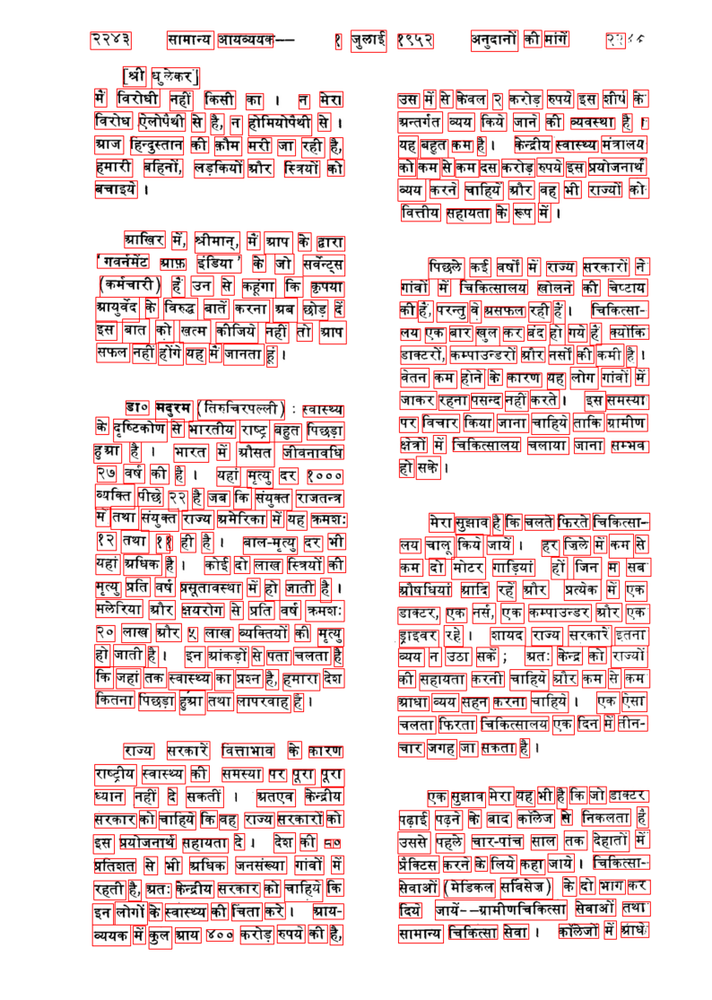

In [4]:
# function to visualize the bounding boxes
def visualize_bboxes(img):
  # plt.imshow(img)
  img_2 = img.copy()
  for index, rows in df.iterrows():
    # print('hello')
    top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
    bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
    # print(top_left)
    cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)

  return img_2

img_2 = visualize_bboxes(img)
plt.figure(figsize=(10, 20))
plt.imshow(img_2)
plt.axis("off")

In [5]:
# to calculate the 4 points of the bounding boxes (bottom-center, top-center, left-center, right-center)
df['Bottom'] = df.apply(lambda row: [(int(row['Bottom-Right'].split(',')[0][1:])+int(row['Top-Left'].split(',')[0][1:]))/2, int(row['Bottom-Right'].split(',')[1][:-1])], axis=1)
df['Top'] = df.apply(lambda row: [(int(row['Bottom-Right'].split(',')[0][1:])+int(row['Top-Left'].split(',')[0][1:]))/2, int(row['Top-Left'].split(',')[1][:-1])], axis=1)
df['Left'] = df.apply(lambda row: [int(row['Top-Left'].split(',')[0][1:]), (int(row['Bottom-Right'].split(',')[1][:-1])+int(row['Top-Left'].split(',')[1][:-1]))/2], axis=1)
df['Right'] = df.apply(lambda row: [int(row['Bottom-Right'].split(',')[0][1:]), (int(row['Bottom-Right'].split(',')[1][:-1])+int(row['Top-Left'].split(',')[1][:-1]))/2], axis=1)

In [6]:
df

,Unnamed: 0,Top-Left,Bottom-Right,Id,Bottom,Top,Left,Right
0,0,"[290, 85]","[435, 147]",0,"[362.5, 147]","[362.5, 85]","[290, 116.0]","[435, 116.0]"
1,1,"[563, 82]","[730, 147]",1,"[646.5, 147]","[646.5, 82]","[563, 114.5]","[730, 114.5]"
2,2,"[744, 92]","[940, 140]",2,"[842.0, 140]","[842.0, 92]","[744, 116.0]","[940, 116.0]"
3,3,"[1163, 92]","[1184, 147]",3,"[1173.5, 147]","[1173.5, 92]","[1163, 119.5]","[1184, 119.5]"
4,4,"[1218, 79]","[1344, 157]",4,"[1281.0, 157]","[1281.0, 79]","[1218, 118.0]","[1344, 118.0]"
...,...,...,...,...,...,...,...,...
493,493,"[1566, 3264]","[1740, 3315]",493,"[1653.0, 3315]","[1653.0, 3264]","[1566, 3289.5]","[1740, 3289.5]"
494,494,"[1762, 3261]","[1851, 3315]",494,"[1806.5, 3315]","[1806.5, 3261]","[1762, 3288.0]","[1851, 3288.0]"
495,495,"[1958, 3261]","[2100, 3312]",495,"[2029.0, 3312]","[2029.0, 3261]","[1958, 3286.5]","[2100, 3286.5]"
496,496,"[2120, 3250]","[2163, 3315]",496,"[2141.5, 3315]","[2141.5, 3250]","[2120, 3282.5]","[2163, 3282.5]"


In [7]:
# defining a custom distance function which take the minimum of the distance between the 4 points of the bounding boxes
def custom_distance(x, y):
    dist_down = np.sqrt((x[0]-y[2])**2 + (x[1]-y[3])**2)
    dist_up = np.sqrt((x[2]-y[0])**2 + (x[3]-y[1])**2)
    dist_left = np.sqrt((x[4]-y[6])**2 + (x[5]-y[7])**2)
    dist_right = np.sqrt((x[6]-y[4])**2 + (x[7]-y[5])**2)
    return min(dist_down, dist_up, dist_left, dist_right)

# function to find the optimal threshold for clustering
def find_threshold(df, need_figure = False):
   
  X = df[['Bottom', 'Top', 'Left', 'Right']].values
  X = [np.array([np.array(xx) for xx in x]) for x in X]
  X = np.array(X)
  X = X.reshape(len(X), -1)

  linkage_matrix = linkage(X, method='single', metric=custom_distance)

  thresholds = []
  # optimal_threshold = linkage_matrix[-1][2]
  difference = 0
  optimal_clusters = 0
  silhouette_scores = []
  n = len(linkage_matrix)
  for n_clusters in range(9, 25):
    clusters = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')
    silhouette_scores.append(silhouette_score(X, clusters, metric= lambda a, b: custom_distance(a, b)))
    thresholds.append(linkage_matrix[n-n_clusters][2])
    if(difference < linkage_matrix[n-n_clusters+1][2] - linkage_matrix[n-n_clusters][2]):
      # optimal_threshold = linkage_matrix[n-n_clusters][2]
      difference = linkage_matrix[n-n_clusters+1][2] - linkage_matrix[n-n_clusters][2]
      optimal_clusters = n_clusters

  thresholds = np.array(thresholds)

  if(need_figure):
    plt.figure(figsize=(10, 6))
    plt.plot(range(9, 25), thresholds)
    plt.xlabel("Number of clusters")
    plt.ylabel("Threshold")
    plt.title("threshold distance vs no of clusters")

    plt.figure(figsize=(10, 6))
    plt.plot(range(9, 25), silhouette_scores)
    plt.xlabel("Number of clusters")
    plt.ylabel("Silhouette Score")
    plt.title("silhouette score vs no of clusters")

  silhouette_scores = np.array(silhouette_scores)

  optimal_clusters = max(np.argmax(silhouette_scores) + 9, optimal_clusters)
  # print(optimal_clusters)

  horizontal_threshold = linkage_matrix[len(linkage_matrix)-optimal_clusters][2]
  vertical_threshold = linkage_matrix[len(linkage_matrix)-optimal_clusters][2]
  # print(horizontal_threshold)

  return optimal_clusters, horizontal_threshold, vertical_threshold

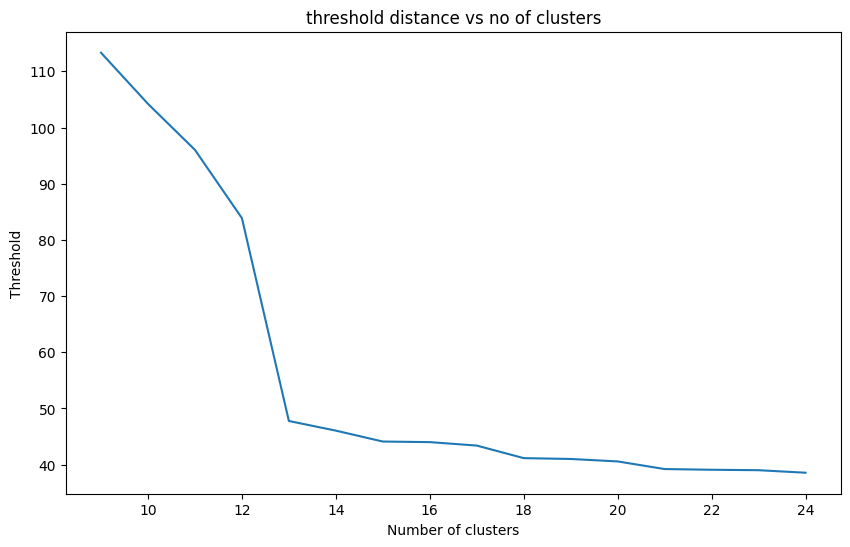

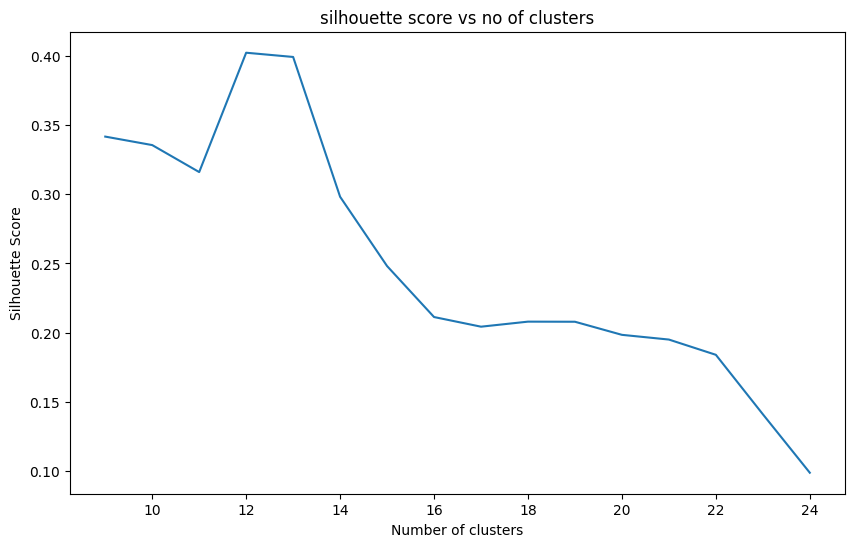

In [8]:
optimal_clusters, horizontal_threshold, vertical_threshold = find_threshold(df, need_figure = True)

In [9]:
def euclidean_distance(p1, p2):
    # p1 = np.array(p1)
    # p2 = np.array(p2)
    return np.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)


# function to find the 4 adjacent boxes for each box based on the threshold
def find_connections(df, image, vertical_threshold, horizontal_threshold):
    image_with_boxes = image.copy()
    df['Bottom_Box'] = df.apply(lambda row: [-1, 0], axis=1)
    df['Right_Box'] = df.apply(lambda row: [-1, 0], axis=1)
    df['Top_Box'] = df.apply(lambda row: [-1, 0], axis=1)
    df['Left_Box'] = df.apply(lambda row: [-1, 0], axis=1)

    # horizontal_threshold = 7
    # vertical_threshold = 8

    for i in range(len(df)):
        for j in range(len(df)):
            if(i==j):
                continue
            dist1 = euclidean_distance((df['Bottom'].iloc[i]), (df['Top'].iloc[j]))
            dist2 = euclidean_distance((df['Top'].iloc[i]), (df['Bottom'].iloc[j]))
            dist3 = euclidean_distance((df['Left'].iloc[i]), (df['Right'].iloc[j]))
            dist4 = euclidean_distance((df['Right'].iloc[i]), (df['Left'].iloc[j]))
            # print(dist1, dist2, dist3, dist4)
            if(dist1<vertical_threshold):
                df['Bottom_Box'].iloc[i] = [j, df['Id'].iloc[j]]
            if(dist2<vertical_threshold):
                df['Top_Box'].iloc[i] = [j, df['Id'].iloc[j]]
            if(dist3<horizontal_threshold):
                df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
            if(dist4<horizontal_threshold):
                df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
    return df
            
df = find_connections(df, img, vertical_threshold=vertical_threshold, horizontal_threshold=horizontal_threshold)

C:\Users\hp\AppData\Local\Temp\ipykernel_12468\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_12468\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_12468\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_B

In [10]:
df
# to store the extracted information in a csv file
df.to_csv('./Part-4/CSV_output/output_68.csv', index=False)

In [11]:
euclidean = pd.read_csv('./Part-4/CSV_output/output_250.csv')

(-0.5, 2474.5, 3499.5, -0.5)

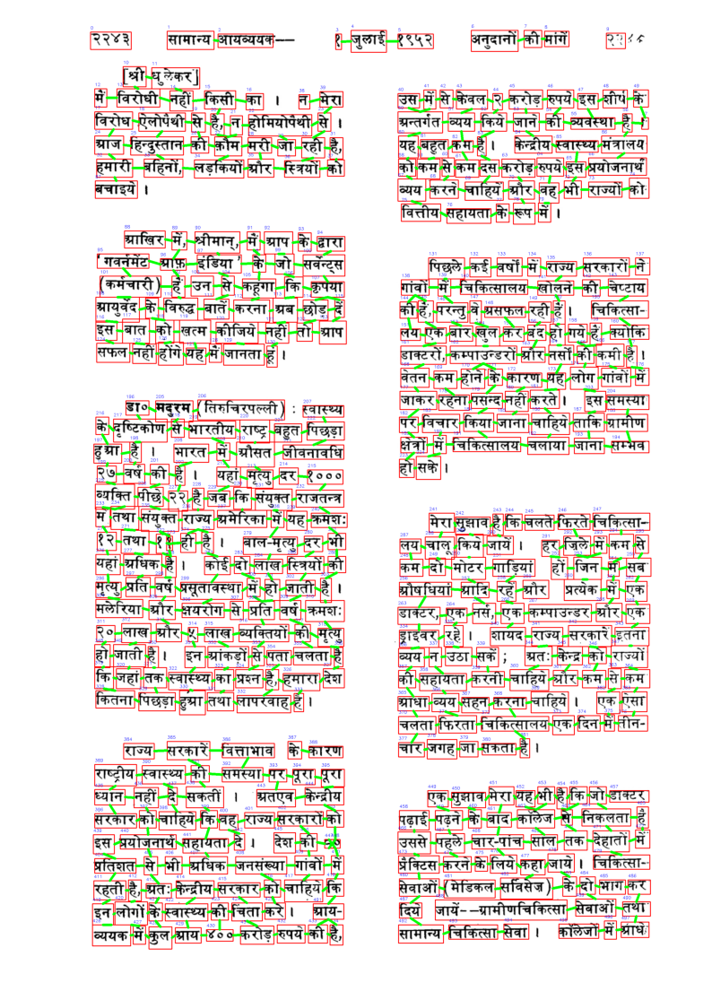

In [12]:
# function to visualize the connections between the boxes
def make_connections(image):

  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image_with_boxes = image_rgb.copy()
  
  for index, row in df.iterrows():
      left = int(row['Left'][0])
      right = int(row['Right'][0])
      top = int(row['Top'][1])
      bottom = int(row['Bottom'][1])
      box_id = int(row['Id'])

      width = right - left
      height = bottom - top

      top_left = (left, top)
      bottom_right = (right, bottom)

      cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

      label_position = (left, top - 10)
      cv2.putText(image_with_boxes, str(box_id), label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

      top_adjacent_id = int(row['Top_Box'][1])
      bottom_adjacent_id = int(row['Bottom_Box'][1])
      left_adjacent_id = int(row['Left_Box'][1])
      right_adjacent_id = int(row['Right_Box'][1])

      if top_adjacent_id != 0:
          top_adjacent_row = df[df['Id'] == top_adjacent_id].iloc[0]
          top_adjacent_center = int(top_adjacent_row['Bottom'][0]) , int(top_adjacent_row['Bottom'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(top)), top_adjacent_center, (0, 255, 0), 8)

      if bottom_adjacent_id != 0:
          bottom_adjacent_row = df[df['Id'] == bottom_adjacent_id].iloc[0]
          bottom_adjacent_center = int(bottom_adjacent_row['Top'][0]) , int(bottom_adjacent_row['Top'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(bottom)), (int(bottom_adjacent_center[0]), int(bottom_adjacent_center[1])), (0, 255, 0), 8)

      if left_adjacent_id != 0:
          left_adjacent_row = df[df['Id'] == left_adjacent_id].iloc[0]
          left_adjacent_center = int(left_adjacent_row['Right'][0]) , int(left_adjacent_row['Right'][1])
          cv2.line(image_with_boxes, (int(left), int(top) + height // 2), (int(left_adjacent_center[0]), int(left_adjacent_center[1])), (0, 255, 0), 8)

      if right_adjacent_id != 0:
          right_adjacent_row = df[df['Id'] == right_adjacent_id].iloc[0]
          right_adjacent_center = int(right_adjacent_row['Left'][0]) , int(right_adjacent_row['Left'][1])
          cv2.line(image_with_boxes, (int(right), int(top) + height // 2), (int(right_adjacent_center[0]), int(right_adjacent_center[1])), (0, 255, 0), 8)

  return image_with_boxes


plt.figure(figsize=(10, 20))
plt.imshow(make_connections(img))
plt.axis("off")

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'

image no: 29
No of clusters:  15
Distance Threshold:  62.6039136156838


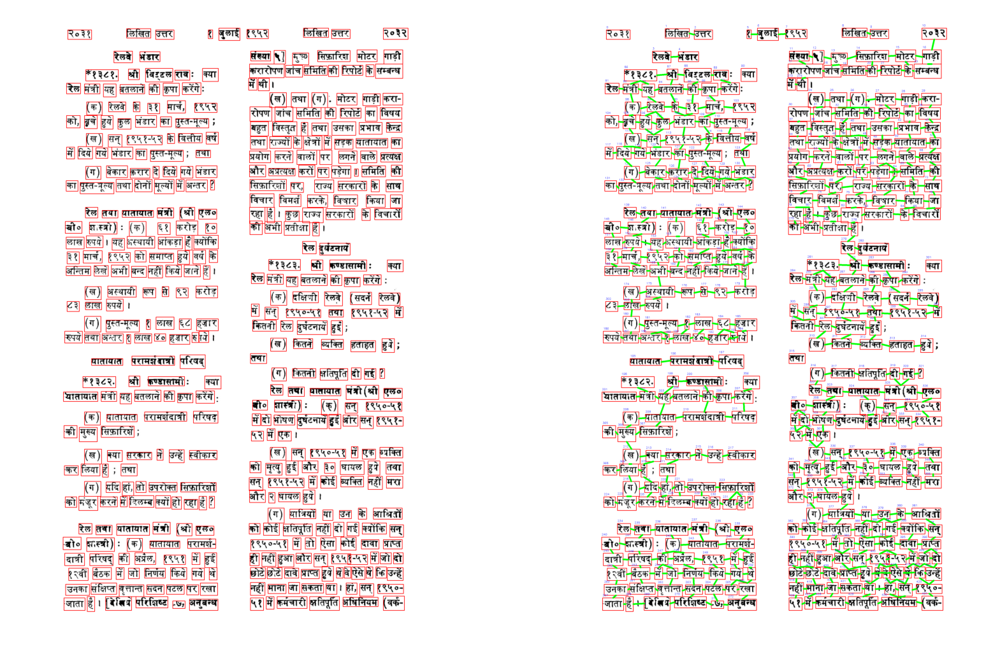

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'

image no: 68
No of clusters:  13
Distance Threshold:  47.762432936357


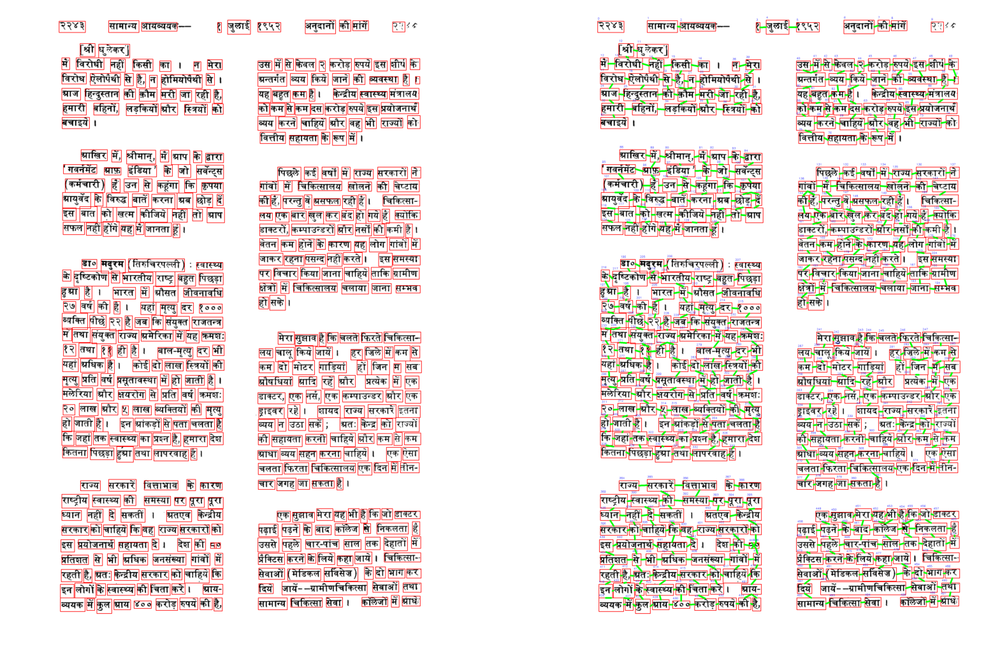

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'

image no: 101
No of clusters:  12
Distance Threshold:  46.69047011971501


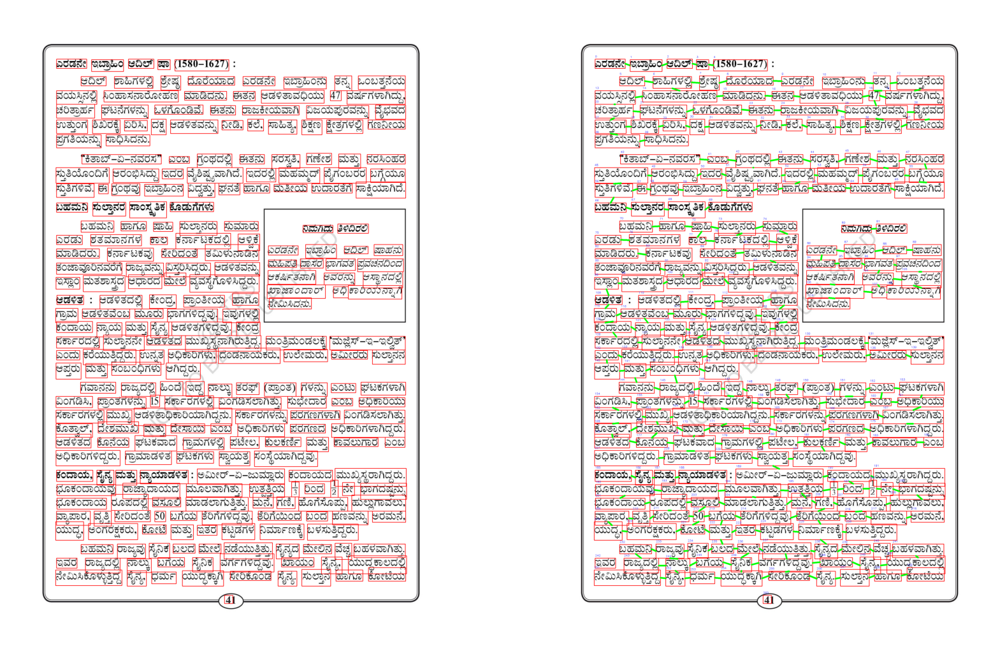

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'

image no: 145
No of clusters:  13
Distance Threshold:  49.86231041578399


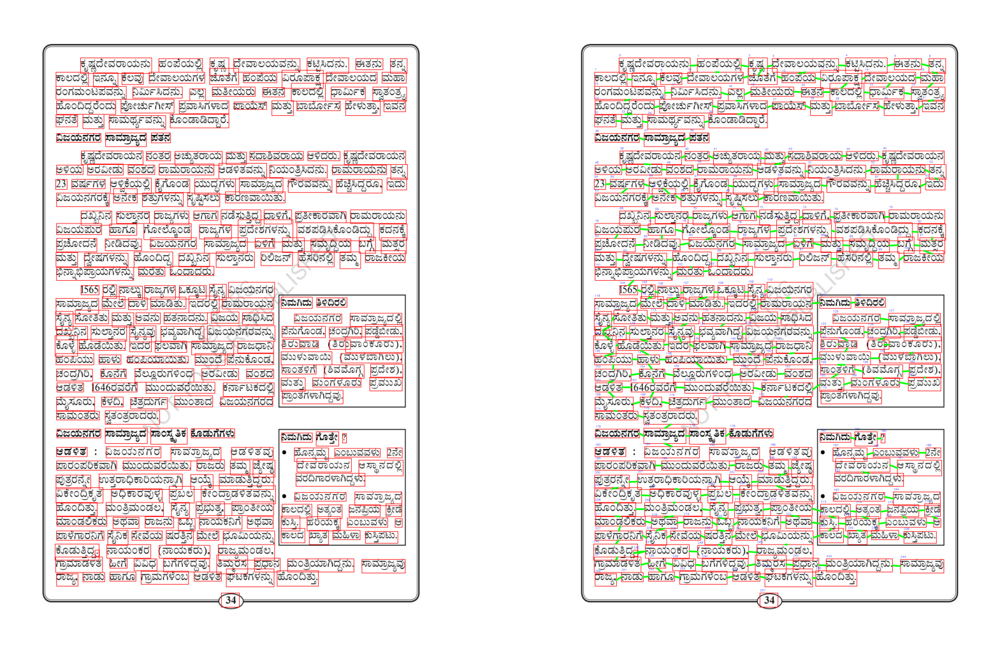

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Bottom_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box

image no: 152
No of clusters:  11
Distance Threshold:  63.7671545546765


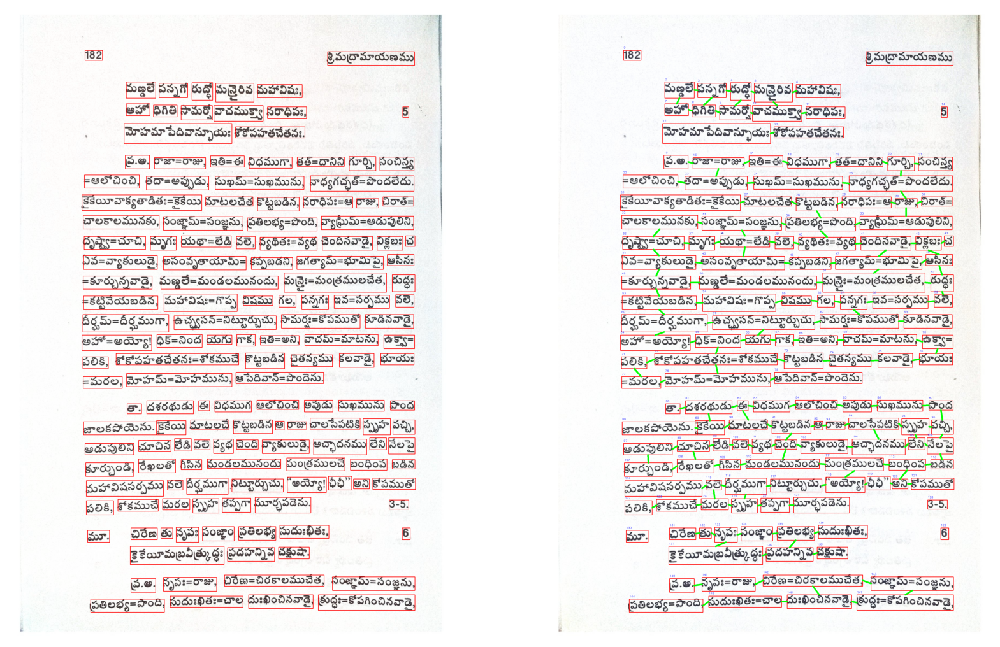

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'

image no: 159
No of clusters:  17
Distance Threshold:  76.42807075937479


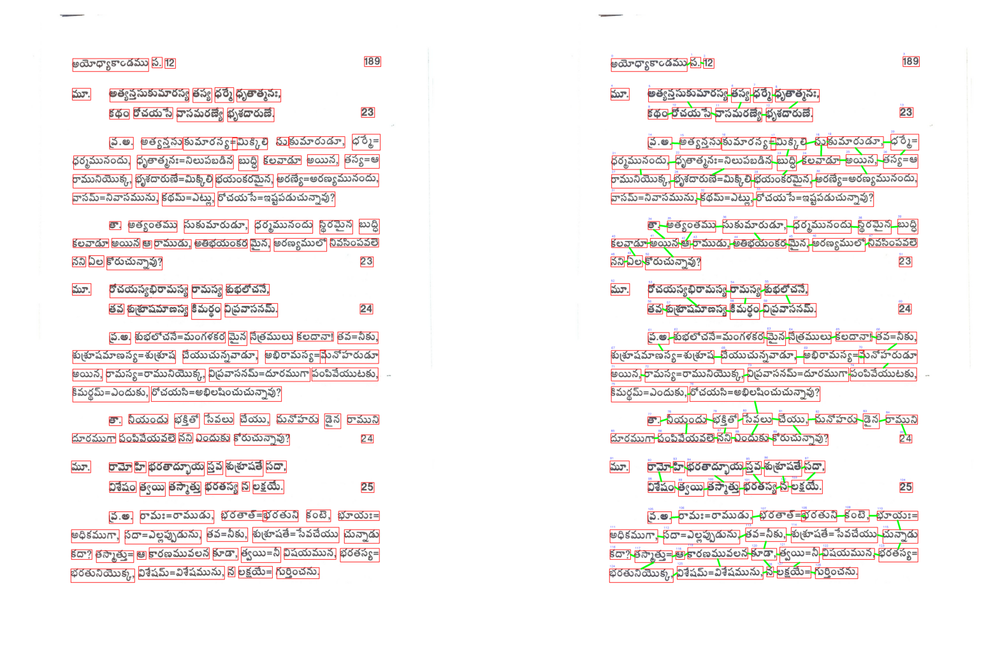

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'

image no: 174
No of clusters:  15
Distance Threshold:  32.745228660065884


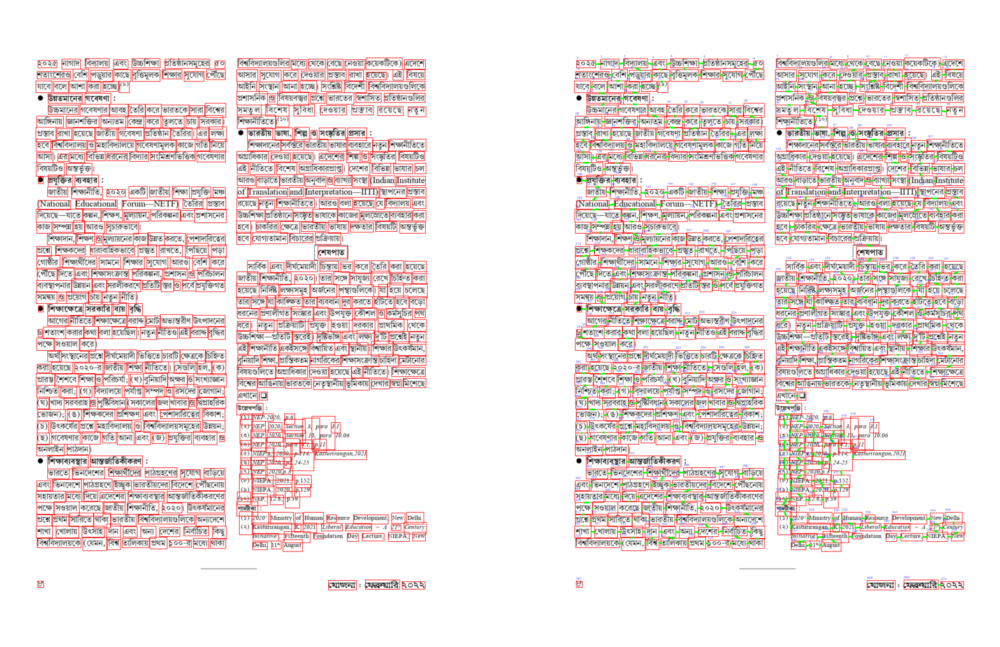

C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Left_Box'].iloc[i] = [j, df['Id'].iloc[j]]
C:\Users\hp\AppData\Local\Temp\ipykernel_8424\1589591191.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Right_Box'

image no: 201
No of clusters:  17
Distance Threshold:  56.462376853972415


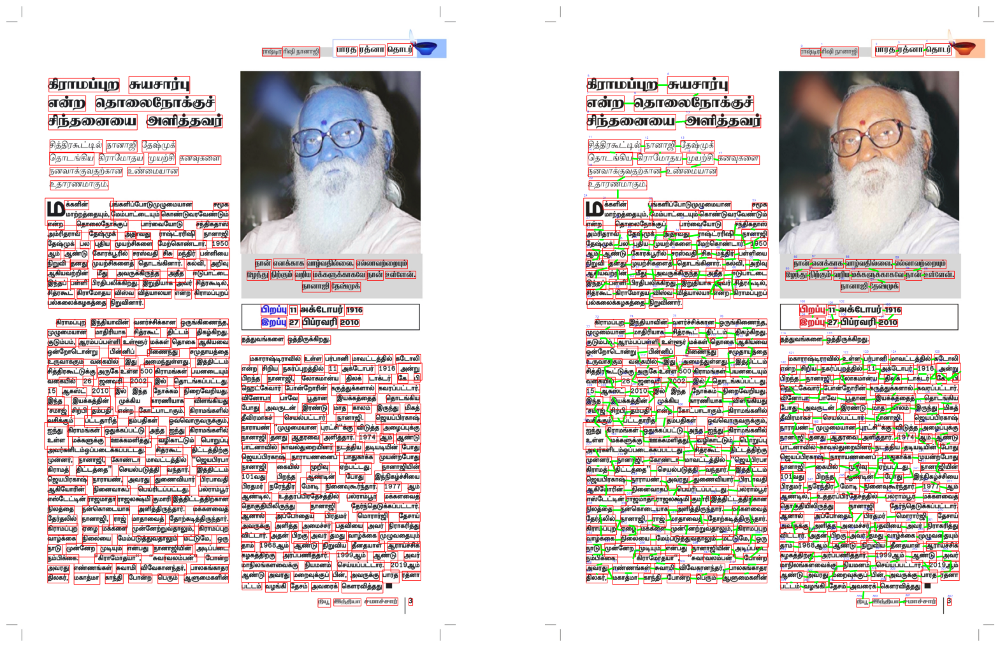

In [13]:
images = ["29", "68", "101", "145", "152", "159", "174", "201", "232", "250"]

for image in images:
    df = pd.read_csv('./Part-4/CSV/TLBR_'+image+'.csv')
    img = cv2.imread('./Part-4/images/'+image+'.jpg')

    df['Bottom'] = df.apply(lambda row: [(int(row['Bottom-Right'].split(',')[0][1:])+int(row['Top-Left'].split(',')[0][1:]))/2, int(row['Bottom-Right'].split(',')[1][:-1])], axis=1)
    df['Top'] = df.apply(lambda row: [(int(row['Bottom-Right'].split(',')[0][1:])+int(row['Top-Left'].split(',')[0][1:]))/2, int(row['Top-Left'].split(',')[1][:-1])], axis=1)
    df['Left'] = df.apply(lambda row: [int(row['Top-Left'].split(',')[0][1:]), (int(row['Bottom-Right'].split(',')[1][:-1])+int(row['Top-Left'].split(',')[1][:-1]))/2], axis=1)
    df['Right'] = df.apply(lambda row: [int(row['Bottom-Right'].split(',')[0][1:]), (int(row['Bottom-Right'].split(',')[1][:-1])+int(row['Top-Left'].split(',')[1][:-1]))/2], axis=1)

    optimal_clusters, horizontal_threshold, vertical_threshold = find_threshold(df)
    df = find_connections(df, img, vertical_threshold=vertical_threshold, horizontal_threshold=horizontal_threshold)
    df.to_csv('./Part-4/CSV_output/output_'+image+'.csv', index=False)

    print("image no: " + image)
    print("No of clusters: ", optimal_clusters)
    print("Distance Threshold: ", horizontal_threshold)
    plt.figure(figsize=(20, 15))
    plt.subplot(1, 2, 1)
    plt.imshow(visualize_bboxes(img))
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(make_connections(img))
    plt.axis("off")
    plt.show()
    

## Hierarchical Clustering Workflow

### Step 1: Data Preparation
1.1. Extract bounding box information (Top-Left, Bottom-Right) from the input DataFrame.

### Step 2: Feature Extraction
2.1. For each bounding box:
    2.1.1. Calculate the coordinates of four points (bottom-center, top-center, left-center, right-center).

### Step 3: Hierarchical Clustering
3.1. Use the four points from Step 2 to calculate a custom distance matrix.
3.2. Apply hierarchical clustering using the linkage method, specifying the custom distance matrix.
3.3. Obtain the linkage matrix.

### Step 4: Determine Optimal Number of Clusters
4.1. Finding the optimal number of clusters based on the number of paragraphs in the image. This is done using the combination of silhouette score and elbow method. The optimal no of cluster is where in the increase in the distance between new cluster formation is maximum.

### Step 5: Calculate Threshold
5.1. Iterate through linkage distances to find the threshold that results in the optimal number of clusters.
5.2. Store the threshold value.

### Step 6: Cluster Assignment
6.1. Re-run hierarchical clustering with the optimal threshold to obtain the clusters.
6.2. Assign each bounding box to its corresponding cluster.

### Step 7: Neighboring Box Identification
7.1. For each box, find the four neighboring boxes within the same cluster.
7.2. Store the neighboring box information (IDs) in a CSV file.

### Step 8: Visualization
8.1. Visualize the document image with bounding boxes and connections.
8.2. Use the provided scripts to visualize bounding boxes and connections.

### Step 9: Output
9.1. Generate a final CSV with box information, cluster IDs, and neighboring box information.
9.2. The final CSV has columns: ID, Top-Left, Bottom-Right, Top, Left, Bottom, Right, Top_box, Bottom_box, Left_box, Right_box.

### Step 10: Final Output
10.1. Obtain the desired box connections and clusters for the document page.
10.2. Use the data for further analysis or visualization.

# End of Workflow
